# Imports

In [ ]:
#!pip install labelme

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.5 MB 6.8 MB/s 
     |████████████████████████████████| 7.7 MB 22.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 8.3 MB 48.7 MB/s 
     |████████████████████████████████| 59.9 MB 93 kB/s 
     |████████████████████████████████| 338 kB 56.2 MB/s 
  Created wheel for labelme: filename=labelme-5.0.1-py3-none-any.whl size=1466204 sha256=7f6744a3d568563d5054b61d50b38c21c2dd97e2a984b4a78eb65712ae23433e
  Stored in directory: /root/.cache/pip/wheels/e4/f1/e1/84b4d6e95299dbc58c1616c63622624e39643ee591866cfd1e
  Created wheel for imgviz: filename=imgviz-1.5.0-py3-none-any.whl size=7680458 sha256=ecbf93e776b356f85a3902464c5713e3cdd3f106b5db37b1c5c44273f25996aa
  Stored in directory: /root/.cache/pip/wheels/a1/36/f3/3c810b6e34387a0307

In [ ]:
from pycocotools.coco import COCO
import numpy as np
import pandas as pd
import skimage.io as io
import labelme
import json
import random
import cv2
import keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Add, Conv2D, MaxPooling2D, AveragePooling2D, UpSampling2D, ZeroPadding2D, Activation, concatenate, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50

### For visualizing the outputs ###
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

# Loading COCO data and self created test data
https://towardsdatascience.com/master-the-coco-dataset-for-semantic-image-segmentation-part-2-of-2-c0d1f593096a

https://towardsdatascience.com/master-the-coco-dataset-for-semantic-image-segmentation-part-1-of-2-732712631047

https://github.com/virafpatrawala/COCO-Semantic-Segmentation/blob/master/COCOdataset_SemanticSegmentation_Demo.ipynb



## Data loader and visualization function definitions

In [ ]:
def filterDataset(folder, classes=None, mode='train'):    
    # initialize COCO api for instance annotations
    annFile = '{}/annotations/instances_{}2014.json'.format(folder, mode)
    coco = COCO(annFile)
    
    images = []
    if classes!=None:
        # iterate for each individual class in the list
        for className in classes:
            # get all images containing given categories
            catIds = coco.getCatIds(catNms=className)
            imgIds = coco.getImgIds(catIds=catIds)
            images += coco.loadImgs(imgIds)
    
    else:
        imgIds = coco.getImgIds()
        images = coco.loadImgs(imgIds)
    
    # Now, filter out the repeated images
    unique_images = []
    for i in range(len(images)):
        if images[i] not in unique_images:
            unique_images.append(images[i])
            
    random.shuffle(unique_images)
    dataset_size = len(unique_images)
    
    return unique_images, dataset_size, coco

In [ ]:
def getClassName(classID, cats):
    for i in range(len(cats)):
        if cats[i]['id']==classID:
            return cats[i]['name']
    return None

def getImage(imageObj, img_folder, input_image_size):
    # Read and normalize an image
    train_img = io.imread(img_folder + '/' + imageObj['file_name'])/255.0
    # Resize
    train_img = cv2.resize(train_img, input_image_size)
    if (len(train_img.shape)==3 and train_img.shape[2]==3): # If it is a RGB 3 channel image
        return train_img
    else: # To handle a black and white image, increase dimensions to 3
        stacked_img = np.stack((train_img,)*3, axis=-1)
        return stacked_img
    
def getNormalMask(imageObj, classes, coco, catIds, input_image_size):
    annIds = coco.getAnnIds(imageObj['id'], catIds=catIds, iscrowd=None)
    anns = coco.loadAnns(annIds)
    cats = coco.loadCats(catIds)
    train_mask = np.zeros(input_image_size)
    for a in range(len(anns)):
        className = getClassName(anns[a]['category_id'], cats)
        pixel_value = classes.index(className)+1
        new_mask = cv2.resize(coco.annToMask(anns[a])*pixel_value, input_image_size)
        train_mask = np.maximum(new_mask, train_mask)

    # Add extra dimension for parity with train_img size [X * X * 3]
    train_mask = train_mask.reshape(input_image_size[0], input_image_size[1], 1)
    return train_mask  
    
def getBinaryMask(imageObj, coco, catIds, input_image_size):
    annIds = coco.getAnnIds(imageObj['id'], catIds=catIds, iscrowd=None)
    anns = coco.loadAnns(annIds)
    train_mask = np.zeros(input_image_size)
    for a in range(len(anns)):
        new_mask = cv2.resize(coco.annToMask(anns[a]), input_image_size)
        
        #Threshold because resizing may cause extraneous values
        new_mask[new_mask >= 0.5] = 1
        new_mask[new_mask < 0.5] = 0

        train_mask = np.maximum(new_mask, train_mask)

    # Add extra dimension for parity with train_img size [X * X * 3]
    train_mask = train_mask.reshape(input_image_size[0], input_image_size[1], 1)
    return train_mask


def dataGeneratorCoco(images, classes, coco, folder, 
                      input_image_size=(224,224), batch_size=4, mode='train', mask_type='binary'):
    
    img_folder = '{}/images/{}'.format(folder, mode)
    dataset_size = len(images)
    catIds = coco.getCatIds(catNms=classes)
    
    c = 0
    while(True):
        img = np.zeros((batch_size, input_image_size[0], input_image_size[1], 3)).astype('float')
        mask = np.zeros((batch_size, input_image_size[0], input_image_size[1], 1)).astype('float')

        for i in range(c, c+batch_size): #initially from 0 to batch_size, when c = 0
            imageObj = images[i]
            
            ### Retrieve Image ###
            train_img = getImage(imageObj, img_folder, input_image_size)
            
            ### Create Mask ###
            if mask_type=="binary":
                train_mask = getBinaryMask(imageObj, coco, catIds, input_image_size)
            
            elif mask_type=="normal":
                train_mask = getNormalMask(imageObj, classes, coco, catIds, input_image_size)                
            
            # Add to respective batch sized arrays
            img[i-c] = train_img
            mask[i-c] = train_mask
            
        c+=batch_size
        if(c + batch_size >= dataset_size):
            c=0
            random.shuffle(images)
        yield img, mask

In [ ]:
def visualizeGenerator(gen):
    img, mask = next(gen)
    
    fig = plt.figure(figsize=(20, 10))
    outerGrid = gridspec.GridSpec(1, 2, wspace=0.1, hspace=0.1)
    
    for i in range(2):
        innerGrid = gridspec.GridSpecFromSubplotSpec(2, 2,
                        subplot_spec=outerGrid[i], wspace=0.05, hspace=0.05)

        for j in range(4):
            ax = plt.Subplot(fig, innerGrid[j])
            if(i==1):
                ax.imshow(img[j])
            else:
                ax.imshow(mask[j][:,:,0])
                
            ax.axis('off')
            fig.add_subplot(ax)        
    plt.show()

In [ ]:
# Load, mask and visualize test data (functions)
def getTestImages(imageObj, imageFolder, input_image_size):     
    # Read and normalize data
    train_image = io.imread(imageFolder + '/' + imageObj + '.jpg')/255.0
    # Resize images
    train_image = cv2.resize(train_image, input_image_size)
    if (len(train_image.shape)==3 and train_image.shape[2]==3):  # If it is an RGB 3 channel image
        return train_image
    else: # If it is a black and white image - to increase dimensions to 3
        stacked_image = np.stack((train_image,)*3, axis=-1)
        return stacked_image
    
def getTestBinaryMask(imageObj, annotFolder, input_image_size):
    train_mask = np.zeros(input_image_size)
    # Load masks from .json files, created with labelme API independently
    with open(annotFolder + '/' + imageObj + '.json', "r", encoding="utf-8") as f:
        dj = json.load(f)
        mask = labelme.utils.shape_to_mask((dj['imageHeight'],
                                                dj['imageWidth']),
                                                dj['shapes'][0]['points'], 
                                                shape_type=None, 
                                                line_width=1, 
                                                point_size=1)
    mask_img = mask.astype('float32')
 
    new_mask = cv2.resize(mask_img, input_image_size)
    # Threshold because resizing may cause extraneous values
    new_mask[new_mask >= 0.5] = 1
    new_mask[new_mask < 0.5] = 0
        
    train_mask = np.maximum(new_mask, train_mask)
    # Add extra dimensions for parity with train_image size (h * w * 3)
    train_mask = train_mask.reshape(input_image_size[0], input_image_size[1], 1)
    return train_mask

def dataGeneratorTest(imgList, imageFolder, annotFolder, input_image_size):

    dataset_size = len(imgList)
    
    img = np.zeros((dataset_size, input_image_size[0], input_image_size[1], 3)).astype('float')
    mask = np.zeros((dataset_size, input_image_size[0], input_image_size[1], 1)).astype('float')
    
    for i in range(0, dataset_size):
        imageObj = imgList[i]
        
        train_img = getTestImages(imageObj, imageFolder, input_image_size)
        
        train_mask = getTestBinaryMask(imageObj, annotFolder, input_image_size)

        img[i] = train_img
        mask[i] = train_mask
        
    return img, mask 

def visualizeTestData(images, masks):
    fig = plt.figure(figsize = (35, 10))
    outerGrid = gridspec.GridSpec(1, 2, wspace = 0.1, hspace = 0.1)
    
    for i in range(2):
        innerGrid = gridspec.GridSpecFromSubplotSpec(2, 4, subplot_spec = outerGrid[i], 
                                                     wspace = 0.025, hspace = 0.025)
        for j in range(8):
            ax = plt.Subplot(fig, innerGrid[j])
            if (i==1):
                ax.imshow(images[j])
            else:
                ax.imshow(masks[j][:, :, 0])
                
            ax.axis('off')
            fig.add_subplot(ax)
    plt.show()

In [ ]:
def visualizeTestPredictions(images, masks, pred):
    fig = plt.figure(figsize = (35, 10))
    outerGrid = gridspec.GridSpec(1, 3, wspace = 0.1, hspace = 0.1)
    
    for i in range(3):
        innerGrid = gridspec.GridSpecFromSubplotSpec(2, 4, subplot_spec = outerGrid[i], 
                                                     wspace = 0.025, hspace = 0.025)
        for j in range(8):
            ax = plt.Subplot(fig, innerGrid[j])
            if (i==0):
                ax.imshow(images[j])
            elif (i==1):
                ax.imshow(masks[j][:, :, 0])
            else:
                ax.imshow(pred[j][:, :, 0])
                
            ax.axis('off')
            fig.add_subplot(ax)
    plt.show()

## Load train and validation data in batches. Load self created test images and masks

In [ ]:
# Colab folder
#folder = '/content/drive/MyDrive/Cat_img_segm/cocodataset'

In [ ]:
folder = 'E:/Viki_DS_Project/Cat_img_segm/cocodataset'

classes = ['cat']

batch_size = 10
input_image_size = (256,256)
mask_type = 'binary'

In [ ]:
mode = 'train'

train_images, dataset_size, coco = filterDataset(folder, classes, mode)

loading annotations into memory...
Done (t=10.98s)
creating index...
index created!


In [ ]:
val_mode = 'val'

val_images, val_dataset_size, val_coco = filterDataset(folder, classes, val_mode)

loading annotations into memory...
Done (t=4.98s)
creating index...
index created!


In [ ]:
train_gen = dataGeneratorCoco(train_images, classes, coco, folder,
                             input_image_size, batch_size, mode, mask_type)

In [ ]:
val_gen = dataGeneratorCoco(val_images, classes, val_coco, folder,
                             input_image_size, batch_size, val_mode, mask_type)

In [ ]:
# Smaller batchsize datasets for VGG and ResNet
batch_size_small = 5

train_gen_small = dataGeneratorCoco(train_images, classes, coco, folder,
                             input_image_size, batch_size_small, mode, mask_type)
val_gen_small = dataGeneratorCoco(val_images, classes, val_coco, folder,
                             input_image_size, batch_size_small, val_mode, mask_type)

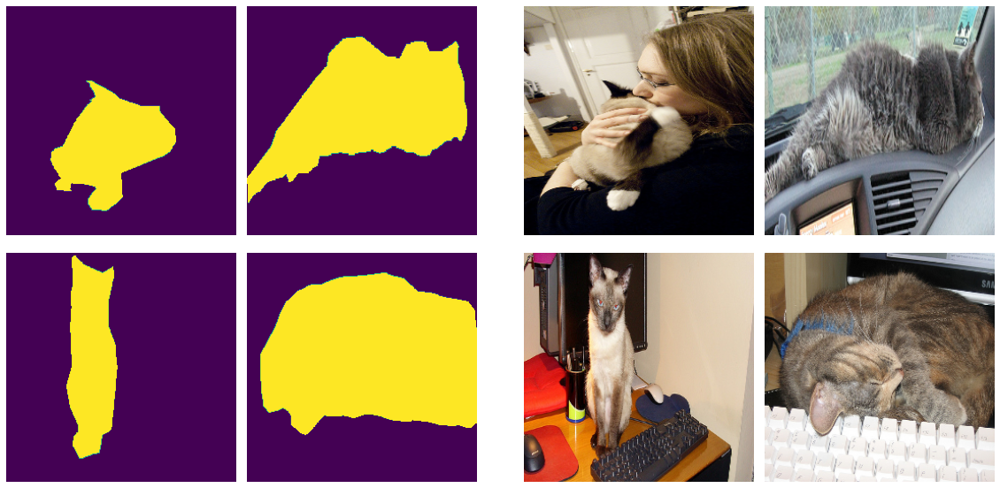

In [ ]:
visualizeGenerator(train_gen)

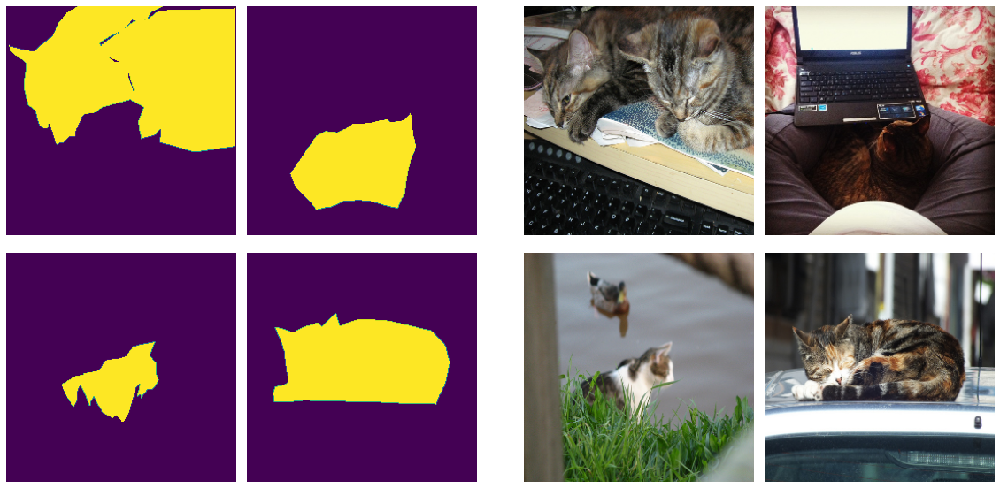

In [ ]:
visualizeGenerator(val_gen)

In [ ]:
imgFolder = "E:/Viki_DS_Project/Cat_img_segm/own_test_images/images"
annFolder = "E:/Viki_DS_Project/Cat_img_segm/own_test_images/annotations"
imgObj = pd.read_csv("E:/Viki_DS_Project/Cat_img_segm/own_test_images/annotations/annot_names.txt", header = None)[0].values

In [ ]:
# Colab drive links
#imgFolder = "/content/drive/MyDrive/Cat_img_segm/own_test_images/images"
#annFolder = "/content/drive/MyDrive/Cat_img_segm/own_test_images/annotations"
#imgObj = pd.read_csv("/content/drive/MyDrive/Cat_img_segm/own_test_images/annotations/annot_names.txt", header = None)[0].values

In [ ]:
test_images, test_masks = dataGeneratorTest(imgObj, imgFolder, annFolder, input_image_size = (256, 256))

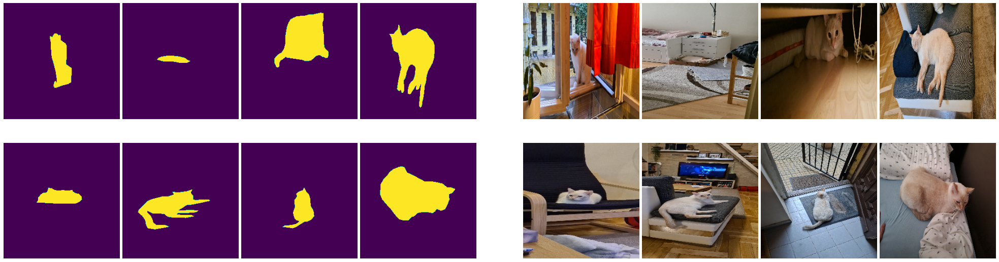

In [ ]:
visualizeTestData(test_images, test_masks)

# Segmantation models and variations

In [ ]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS =  3
N_CLASSES = 1
LEARNING_RATE = 1e-3
EPOCHS = 25
STEPS_PER_EPOCH = len(train_images) // batch_size
VALIDATION_STEPS = len(val_images) // batch_size
OPTIMIZER = Adam
LOSS = 'binary_crossentropy'
METRICS = ['accuracy']

# Smaller  batchsize and different learning rate
LEARNING_RATE_small = 1e-5
STEPS_PER_EPOCH_small = len(train_images) // batch_size_small
VALIDATION_STEPS_small = len(val_images) // batch_size_small

## VGG16/VGG19 Structure

https://arxiv.org/pdf/1409.1556.pdf

https://www.youtube.com/watch?v=mjk4vDYOwq0

https://eudl.eu/pdf/10.4108/eai.18-7-2019.2287943

https://www.ri.cmu.edu/pub_files/2015/10/CMU-RI-TR_AmanRaj_revision2.pdf

https://towardsdatascience.com/step-by-step-vgg16-implementation-in-keras-for-beginners-a833c686ae6c

https://iq.opengenus.org/vgg19-architecture/

https://keras.io/api/applications/vgg/

https://machinelearningknowledge.ai/keras-implementation-of-vgg16-architecture-from-scratch-with-dogs-vs-cat-data-set/

### VGG16 model version 2

Added dropout layers in each block

learning rate 1-e5, batch size 5

In [ ]:
def VGG16Model_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Block 1
    c1 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(x)
    c1 = BatchNormalization()(c1)
    d1 = Dropout(0.2)(c1)
    c1 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    # Block 2
    c2 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p1)
    c2 = BatchNormalization()(c2)
    d2 = Dropout(0.2)(c2)
    c2 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    # Block 3
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p2)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.1)(c3)
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.1)(c3)
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    # Block 4
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p3)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.1)(c4)    
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.1)(c4)
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)

    # Block 5 
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p4)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.1)(c5)    
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.1)(c5)
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    p5 = MaxPooling2D(pool_size = (2, 2))(c5)
    
    # Fully connected block
    f6 = Flatten()(p5)
    c6 = Dense(1000, activation = 'relu')(f6)
    c6 = Dense(1000, activation = 'relu')(c6)
    c6 = Dense(65536, activation = 'softmax')(c6)
    
    # Reshape tensors to 2D matrix from vector
    outputs = tf.reshape(c6, (-1, IMG_HEIGHT, IMG_WIDTH, N_CLASSES))
    
    model = Model(inputs, outputs, name = 'VGG16_v2')
    
    return model

In [ ]:
vgg16_model_v2 = VGG16Model_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
vgg16_model_v2.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE_small), 
                      loss = LOSS, 
                      metrics = METRICS)
vgg16_model_v2.summary()

Model: "VGG16_v2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_79 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 batch_normalization_76 (Bat  (None, 256, 256, 64)     256       
 chNormalization)                                                
                                                                 
 dropout_53 (Dropout)        (None, 256, 256, 64)      0         
                                                                 
 conv2d_80 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_77 (Bat  (None, 256, 256, 64)     256       
 chNormalization)                                         

In [ ]:
vgg16_train_v2 = vgg16_model_v2.fit(train_gen_small,
                                  validation_data=val_gen_small,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH_small,
                                  validation_steps = VALIDATION_STEPS_small,
                                  verbose = True)

Epoch 1/25
563/563 [==============================] - 95s 161ms/step - loss: 1.9625 - accuracy: 0.8190 - val_loss: 2.0471 - val_accuracy: 0.8107
Epoch 2/25
563/563 [==============================] - 90s 160ms/step - loss: 1.9543 - accuracy: 0.8191 - val_loss: 2.0525 - val_accuracy: 0.8102
Epoch 3/25
563/563 [==============================] - 90s 159ms/step - loss: 1.9544 - accuracy: 0.8189 - val_loss: 2.0589 - val_accuracy: 0.8093
Epoch 4/25
563/563 [==============================] - 89s 158ms/step - loss: 1.9454 - accuracy: 0.8191 - val_loss: 2.0383 - val_accuracy: 0.8115
Epoch 5/25
563/563 [==============================] - 89s 159ms/step - loss: 1.9390 - accuracy: 0.8191 - val_loss: 2.0402 - val_accuracy: 0.8107
Epoch 6/25
563/563 [==============================] - 89s 159ms/step - loss: 1.9328 - accuracy: 0.8191 - val_loss: 2.0398 - val_accuracy: 0.8109
Epoch 7/25
563/563 [==============================] - 89s 159ms/step - loss: 1.9269 - accuracy: 0.8190 - val_loss: 2.0520 - val_ac

In [ ]:
vgg16_model_v2.save('vgg16_v2')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: vgg16_v2\assets


INFO:tensorflow:Assets written to: vgg16_v2\assets


In [ ]:
vgg16_model_v2_rl = keras.models.load_model('vgg16_v2')

In [ ]:
vgg16_model_v2_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 2s 2s/step - loss: 0.8691 - accuracy: 0.9146


[0.8690904378890991, 0.9146137237548828]

In [ ]:
vgg16_pred_v2 = vgg16_model_v2_rl.predict(test_images)

1/1 [==============================] - 0s 262ms/step


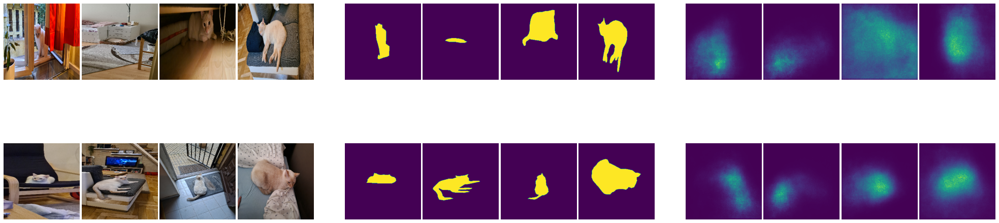

In [ ]:
visualizeTestPredictions(test_images, test_masks, vgg16_pred_v2)

### VGG19 model version 2

Added dropout layers in each block

In [ ]:
def VGG19Model_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Block 1
    c1 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(x)
    c1 = BatchNormalization()(c1)
    d1 = Dropout(0.2)(c1)
    c1 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    # Block 2
    c2 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p1)
    c2 = BatchNormalization()(c2)
    d2 = Dropout(0.2)(c2)
    c2 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    # Block 3
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p2)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.1)(c3)
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.1)(c3)
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.1)(c3)
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    # Block 4
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p3)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.1)(c4)    
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.1)(c4)
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.1)(c4)
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)

    # Block 5 
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p4)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.1)(c5)    
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.1)(c5)
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.1)(c5)
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    p5 = MaxPooling2D(pool_size = (2, 2))(c5)
    
    # Fully connected block
    f6 = Flatten()(p5)
    c6 = Dense(1000, activation = 'relu')(f6)
    c6 = Dense(1000, activation = 'relu')(c6)
    c6 = Dense(65536, activation = 'softmax')(c6)
    
    # Reshape tensors to 2D matrix from vector
    outputs = tf.reshape(c6, (-1, IMG_HEIGHT, IMG_WIDTH, N_CLASSES))
    
    model = Model(inputs, outputs, name = 'VGG19_v2')
    
    return model

In [ ]:
vgg19_model_v2 = VGG19Model_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
vgg19_model_v2.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE_small), 
                      loss = LOSS, 
                      metrics = METRICS)
vgg19_model_v2.summary()

Model: "VGG19_v2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_38 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 batch_normalization_37 (Bat  (None, 256, 256, 64)     256       
 chNormalization)                                                
                                                                 
 dropout_26 (Dropout)        (None, 256, 256, 64)      0         
                                                                 
 conv2d_39 (Conv2D)          (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_38 (Bat  (None, 256, 256, 64)     256       
 chNormalization)                                         

In [ ]:
vgg19_train_v2 = vgg19_model_v2.fit(train_gen_small,
                                  validation_data=val_gen_small,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH_small,
                                  validation_steps = VALIDATION_STEPS_small,
                                  verbose = True)

Epoch 1/25
563/563 [==============================] - 104s 181ms/step - loss: 1.9609 - accuracy: 0.8191 - val_loss: 2.0320 - val_accuracy: 0.8121
Epoch 2/25
563/563 [==============================] - 102s 182ms/step - loss: 1.9544 - accuracy: 0.8191 - val_loss: 2.0733 - val_accuracy: 0.8085
Epoch 3/25
563/563 [==============================] - 102s 182ms/step - loss: 1.9535 - accuracy: 0.8191 - val_loss: 2.0555 - val_accuracy: 0.8098
Epoch 4/25
563/563 [==============================] - 102s 182ms/step - loss: 1.9505 - accuracy: 0.8188 - val_loss: 2.0239 - val_accuracy: 0.8123
Epoch 5/25
563/563 [==============================] - 102s 182ms/step - loss: 1.9438 - accuracy: 0.8190 - val_loss: 2.0392 - val_accuracy: 0.8112
Epoch 6/25
563/563 [==============================] - 102s 182ms/step - loss: 1.9389 - accuracy: 0.8190 - val_loss: 2.0824 - val_accuracy: 0.8073
Epoch 7/25
563/563 [==============================] - 102s 182ms/step - loss: 1.9346 - accuracy: 0.8190 - val_loss: 2.0571 -

In [ ]:
vgg19_model_v2.save('vgg19_v2')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: vgg19_v2\assets


INFO:tensorflow:Assets written to: vgg19_v2\assets


In [ ]:
vgg19_model_v2_rl = keras.models.load_model('vgg19_v2')

In [ ]:
vgg19_model_v2_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 0s 423ms/step - loss: 0.8924 - accuracy: 0.9146


[0.8923612833023071, 0.9146137237548828]

In [ ]:
vgg19_pred_v2 = vgg19_model_v2_rl.predict(test_images)

1/1 [==============================] - 0s 281ms/step


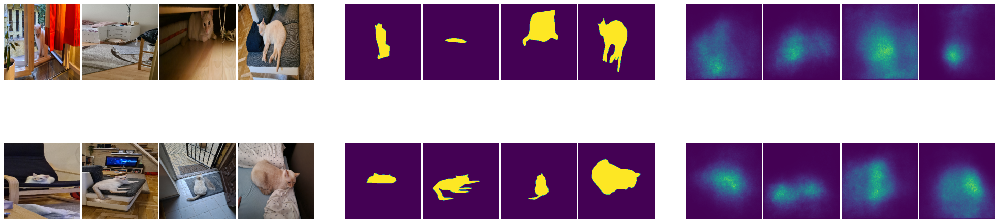

In [ ]:
visualizeTestPredictions(test_images, test_masks, vgg19_pred_v2)

## ResNet50/ResNet101 Structure

https://github.com/dbaofd/solar-panels-detection/blob/master/segnet_resnet_v1.ipynb

https://github.com/christianversloot/machine-learning-articles/blob/main/how-to-build-a-resnet-from-scratch-with-tensorflow-2-and-keras.md

https://machinelearningknowledge.ai/keras-implementation-of-resnet-50-architecture-from-scratch/

https://machinelearningmastery.com/how-to-implement-major-architecture-innovations-for-convolutional-neural-networks/

https://www.analyticsvidhya.com/blog/2021/08/how-to-code-your-resnet-from-scratch-in-tensorflow/

https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

https://arxiv.org/abs/1512.03385

https://towardsdatascience.com/understanding-and-visualizing-resnets-442284831be8

https://www.analyticsvidhya.com/blog/2021/06/build-resnet-from-scratch-with-python/

https://towardsdatascience.com/an-overview-of-resnet-and-its-variants-5281e2f56035

### ResNet50 model

In [ ]:
def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c')(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1')(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [ ]:
def ResNetModel_v1(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):

    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    X = ZeroPadding2D((3, 3))(inputs)

    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1')(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')

    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')

    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    
    # Fully connected block
    X = Flatten()(X)
    X = Dense(125, activation = 'relu')(X)
    X = Dense(65536, activation = 'softmax')(X)
    
    # Reshape tensors to 2D matrix from vector
    outputs = tf.reshape(X, (-1, IMG_HEIGHT, IMG_WIDTH, N_CLASSES))
    
    model = Model(inputs, outputs, name = 'ResNet_v1')

    return model

In [ ]:
resnet_model_v1 = ResNetModel_v1(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
resnet_model_v1.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE_small), 
                          loss = LOSS, 
                          metrics = METRICS)
resnet_model_v1.summary()

Model: "ResNet_v1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 262, 262, 3)  0          ['input_5[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1 (Conv2D)                 (None, 128, 128, 64  9472        ['zero_padding2d_2[0][0]']       
                                )                                                         

In [ ]:
resnet_train_v1 = resnet_model_v1.fit(train_gen_small,
                                      validation_data=val_gen_small,
                                      epochs = EPOCHS,
                                      steps_per_epoch = STEPS_PER_EPOCH_small,
                                      validation_steps = VALIDATION_STEPS_small,
                                      verbose = True)

Epoch 1/25
563/563 [==============================] - 78s 127ms/step - loss: 1.9691 - accuracy: 0.8187 - val_loss: 2.0499 - val_accuracy: 0.8103
Epoch 2/25
563/563 [==============================] - 58s 104ms/step - loss: 1.9551 - accuracy: 0.8191 - val_loss: 2.0410 - val_accuracy: 0.8110
Epoch 3/25
563/563 [==============================] - 59s 105ms/step - loss: 1.9566 - accuracy: 0.8189 - val_loss: 2.0473 - val_accuracy: 0.8106
Epoch 4/25
563/563 [==============================] - 59s 105ms/step - loss: 1.9571 - accuracy: 0.8188 - val_loss: 2.0529 - val_accuracy: 0.8100
Epoch 5/25
563/563 [==============================] - 59s 105ms/step - loss: 1.9552 - accuracy: 0.8189 - val_loss: 2.0376 - val_accuracy: 0.8114
Epoch 6/25
563/563 [==============================] - 59s 105ms/step - loss: 1.9532 - accuracy: 0.8191 - val_loss: 2.0631 - val_accuracy: 0.8091
Epoch 7/25
563/563 [==============================] - 59s 105ms/step - loss: 1.9548 - accuracy: 0.8189 - val_loss: 2.0308 - val_ac

In [ ]:
resnet_model_v1.save('resnet_v1')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: resnet_v1\assets


INFO:tensorflow:Assets written to: resnet_v1\assets


In [ ]:
resnet_model_v1_rl = keras.models.load_model('resnet_v1')

In [ ]:
resnet_model_v1_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 1s 1s/step - loss: 0.8866 - accuracy: 0.9146


[0.886584460735321, 0.9146137237548828]

In [ ]:
resnet_pred_v1 = resnet_model_v1_rl.predict(test_images)

1/1 [==============================] - 1s 816ms/step


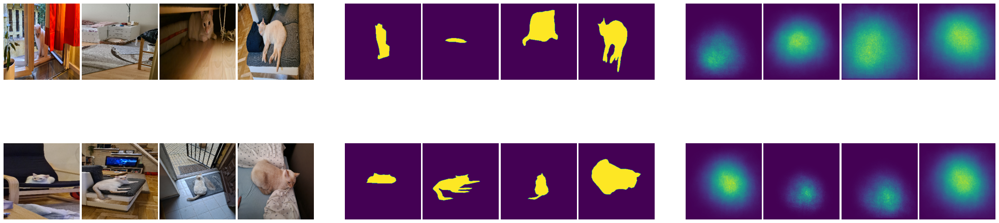

In [ ]:
visualizeTestPredictions(test_images, test_masks, resnet_pred_v1)

### ResNet101 model

In [ ]:
def ResNetModel_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):

    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

    X = ZeroPadding2D((3, 3))(inputs)

    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1')(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')

    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='g')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='h')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='i')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='j')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='k')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='l')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='m')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='n')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='o')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='p')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='q')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='r')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='s')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='t')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='u')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='v')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='z')

    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')

    X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    
    # Fully connected block
    X = Flatten()(X)
    X = Dense(125, activation = 'relu')(X)
    X = Dense(65536, activation = 'softmax')(X)
    
    # Reshape tensors to 2D matrix from vector
    outputs = tf.reshape(X, (-1, IMG_HEIGHT, IMG_WIDTH, N_CLASSES))
    
    model = Model(inputs, outputs, name = 'ResNet_v2')

    return model

In [ ]:
resnet_model_v2 = ResNetModel_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
resnet_model_v2.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE_small), 
                          loss = LOSS, 
                          metrics = METRICS)
resnet_model_v2.summary()

Model: "ResNet_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_3 (ZeroPadding2  (None, 262, 262, 3)  0          ['input_6[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1 (Conv2D)                 (None, 128, 128, 64  9472        ['zero_padding2d_3[0][0]']       
                                )                                                         

In [ ]:
resnet_train_v2 = resnet_model_v2.fit(train_gen_small,
                                      validation_data=val_gen_small,
                                      epochs = EPOCHS,
                                      steps_per_epoch = STEPS_PER_EPOCH_small,
                                      validation_steps = VALIDATION_STEPS_small,
                                      verbose = True)

Epoch 1/25
563/563 [==============================] - 100s 160ms/step - loss: 1.9679 - accuracy: 0.8188 - val_loss: 2.0531 - val_accuracy: 0.8100
Epoch 2/25
563/563 [==============================] - 89s 159ms/step - loss: 1.9581 - accuracy: 0.8188 - val_loss: 2.0636 - val_accuracy: 0.8091
Epoch 3/25
563/563 [==============================] - 89s 157ms/step - loss: 1.9555 - accuracy: 0.8190 - val_loss: 2.0488 - val_accuracy: 0.8104
Epoch 4/25
563/563 [==============================] - 88s 156ms/step - loss: 1.9542 - accuracy: 0.8191 - val_loss: 2.0553 - val_accuracy: 0.8098
Epoch 5/25
563/563 [==============================] - 88s 156ms/step - loss: 1.9517 - accuracy: 0.8193 - val_loss: 2.0489 - val_accuracy: 0.8105
Epoch 6/25
563/563 [==============================] - 88s 157ms/step - loss: 1.9575 - accuracy: 0.8188 - val_loss: 2.0662 - val_accuracy: 0.8087
Epoch 7/25
563/563 [==============================] - 88s 156ms/step - loss: 1.9545 - accuracy: 0.8190 - val_loss: 2.0195 - val_a

In [ ]:
resnet_model_v2.save('resnet_v2')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: resnet_v2\assets


INFO:tensorflow:Assets written to: resnet_v2\assets


In [ ]:
resnet_model_v2_rl = keras.models.load_model('resnet_v2')

In [ ]:
resnet_model_v2_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 2s 2s/step - loss: 0.8990 - accuracy: 0.9146


[0.8990083336830139, 0.9146137237548828]

In [ ]:
resnet_pred_v2 = resnet_model_v2_rl.predict(test_images)

1/1 [==============================] - 2s 2s/step


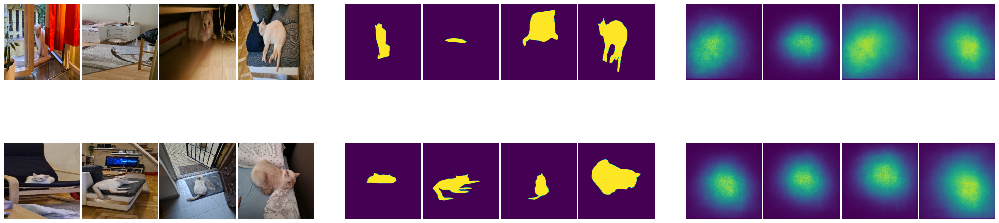

In [ ]:
visualizeTestPredictions(test_images, test_masks, resnet_pred_v2)

## U-Net Structure
https://github.com/Paulymorphous/skeyenet/blob/master/Src/Road_Detection_GPU.ipynb 

https://youtu.be/dIRbGz2Rn3w

https://youtu.be/oBIkr7CAE6g

https://github.com/bnsreenu/python_for_image_processing_APEER

https://github.com/bnsreenu/python_for_image_processing_APEER/blob/master/tutorial118_binary_semantic_segmentation_using_unet.ipynb

https://github.com/bnsreenu/python_for_image_processing_APEER/blob/master/tutorial117_building_unet_using_encoder_decoder_blocks.ipynb

### U-Net model version 1

Original structure

In [ ]:
def UNetModel_v1(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Encoder part - contraction
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(x)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(p1)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(p2)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p3)
    d4 = Dropout(0.2)(c4)    
    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)
    
    ## Bottleneck part - bottom
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p4)
    d5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d5)
    
    # Decoder part - expansion
    u6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c5))
    u6 = concatenate([u6, c4], axis = 3)
    c6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(u6)
    d6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d6)

    u7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c6))
    u7 = concatenate([u7, c3], axis = 3)
    c7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(u7)
    d7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d7)

    u8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c7))
    u8 = concatenate([u8, c2], axis = 3)
    c8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(u8)
    d8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d8)

    u9 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c8))
    u9 = concatenate([u9, c1], axis = 3)
    c9 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(u9)
    d9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d9)

    outputs = Conv2D(N_CLASSES, (1, 1), activation = 'sigmoid')(c9)
    
    model = Model(inputs, outputs, name = 'U-Net_v1')
    
    return model

In [ ]:
unet_model_v1 = UNetModel_v1(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
unet_model_v1.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE), 
                      loss = LOSS, 
                      metrics = METRICS)
unet_model_v1.summary()

Model: "U-Net_v1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 dropout (Dropout)              (None, 256, 256, 16  0           ['conv2d[0][0]']                 
                                )                                                          

In [ ]:
unet_train_v1 = unet_model_v1.fit(train_gen,
                                  validation_data=val_gen,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH,
                                  validation_steps = VALIDATION_STEPS,
                                  verbose = True)

Epoch 1/25
281/281 [==============================] - 57s 177ms/step - loss: 0.4458 - accuracy: 0.8185 - val_loss: 0.4065 - val_accuracy: 0.8099
Epoch 2/25
281/281 [==============================] - 42s 151ms/step - loss: 0.4045 - accuracy: 0.8202 - val_loss: 0.4078 - val_accuracy: 0.8211
Epoch 3/25
281/281 [==============================] - 43s 152ms/step - loss: 0.3972 - accuracy: 0.8260 - val_loss: 0.4029 - val_accuracy: 0.8193
Epoch 4/25
281/281 [==============================] - 43s 152ms/step - loss: 0.3948 - accuracy: 0.8274 - val_loss: 0.4345 - val_accuracy: 0.8039
Epoch 5/25
281/281 [==============================] - 42s 151ms/step - loss: 0.3925 - accuracy: 0.8293 - val_loss: 0.4052 - val_accuracy: 0.8228
Epoch 6/25
281/281 [==============================] - 42s 151ms/step - loss: 0.3897 - accuracy: 0.8294 - val_loss: 0.3942 - val_accuracy: 0.8260
Epoch 7/25
281/281 [==============================] - 43s 152ms/step - loss: 0.3863 - accuracy: 0.8319 - val_loss: 0.3860 - val_ac

In [ ]:
unet_model_v1.save('unet_v1')

INFO:tensorflow:Assets written to: unet_v1\assets


INFO:tensorflow:Assets written to: unet_v1\assets


In [ ]:
unet_model_v1_rl = keras.models.load_model('unet_v1')

In [ ]:
unet_model_v1_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 1s 989ms/step - loss: 0.1655 - accuracy: 0.9474


[0.165452778339386, 0.9474105834960938]

In [ ]:
unet_pred_v1 = unet_model_v1_rl.predict(test_images)

1/1 [==============================] - 0s 224ms/step


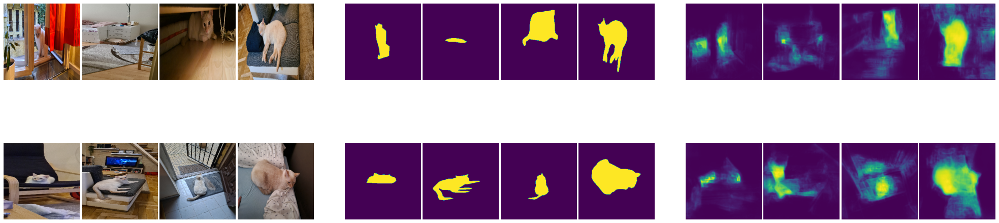

In [ ]:
visualizeTestPredictions(test_images, test_masks, unet_pred_v1)

### U-Net model version 2

Deepening the model

In [ ]:
def UNetModel_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Encoder part - contraction
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(x)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(p1)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(p2)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p3)
    d4 = Dropout(0.2)(c4)    
    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)
    
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p4)
    d5 = Dropout(0.3)(c5)    
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d5)
    p5 = MaxPooling2D(pool_size = (2, 2))(c5)
    
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p5)
    d6 = Dropout(0.3)(c6)    
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d6)
    p6 = MaxPooling2D(pool_size = (2, 2))(c6)
    
    ## Bottleneck part - bottom
    c7 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(p6)
    d7 = Dropout(0.4)(c7)
    c7 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(d7)
    
    # Decoder part - expansion
    u8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c7))
    u8 = concatenate([u8, c6], axis = 3)
    c8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(u8)
    d8 = Dropout(0.3)(c8)
    c8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d8)

    u9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c8))
    u9 = concatenate([u9, c5], axis = 3)
    c9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(u9)
    d9 = Dropout(0.3)(c9)
    c9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d9)

    u10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c9))
    u10 = concatenate([u10, c4], axis = 3)
    c10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(u10)
    d10 = Dropout(0.2)(c10)
    c10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d10)

    u11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c10))
    u11 = concatenate([u11, c3], axis = 3)
    c11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(u11)
    d11 = Dropout(0.2)(c11)
    c11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d11)
    
    u12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c11))
    u12 = concatenate([u12, c2], axis = 3)
    c12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(u12)
    d12 = Dropout(0.1)(c12)
    c12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d12)
    
    u13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c12))
    u13 = concatenate([u13, c1], axis = 3)
    c13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(u13)
    d13 = Dropout(0.1)(c13)
    c13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d13)

    outputs = Conv2D(N_CLASSES, (1, 1), activation = 'sigmoid')(c13)
    
    model = Model(inputs, outputs, name = 'U-Net_v2')
    
    return model

In [ ]:
unet_model_v2 = UNetModel_v2(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
unet_model_v2.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE), 
                      loss = LOSS, 
                      metrics = METRICS)
unet_model_v2.summary()

Model: "U-Net_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_23 (Conv2D)             (None, 256, 256, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_9 (Dropout)            (None, 256, 256, 16  0           ['conv2d_23[0][0]']              
                                )                                                          

In [ ]:
unet_train_v2 = unet_model_v2.fit(train_gen,
                                  validation_data=val_gen,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH,
                                  validation_steps = VALIDATION_STEPS,
                                  verbose = True)

Epoch 1/25
281/281 [==============================] - 58s 190ms/step - loss: 1.2979 - accuracy: 0.8192 - val_loss: 0.5085 - val_accuracy: 0.8090
Epoch 2/25
281/281 [==============================] - 54s 193ms/step - loss: 0.4158 - accuracy: 0.8192 - val_loss: 0.4066 - val_accuracy: 0.8228
Epoch 3/25
281/281 [==============================] - 54s 191ms/step - loss: 0.3910 - accuracy: 0.8258 - val_loss: 0.3993 - val_accuracy: 0.8213
Epoch 4/25
281/281 [==============================] - 54s 192ms/step - loss: 0.3797 - accuracy: 0.8319 - val_loss: 0.4288 - val_accuracy: 0.8225
Epoch 5/25
281/281 [==============================] - 54s 192ms/step - loss: 0.3707 - accuracy: 0.8356 - val_loss: 0.3675 - val_accuracy: 0.8355
Epoch 6/25
281/281 [==============================] - 54s 193ms/step - loss: 0.3557 - accuracy: 0.8429 - val_loss: 0.3632 - val_accuracy: 0.8372
Epoch 7/25
281/281 [==============================] - 53s 190ms/step - loss: 0.3502 - accuracy: 0.8463 - val_loss: 0.3611 - val_ac

In [ ]:
unet_model_v2.save('unet_v2')

INFO:tensorflow:Assets written to: unet_v2\assets


INFO:tensorflow:Assets written to: unet_v2\assets


In [ ]:
unet_model_v2_rl = keras.models.load_model('unet_v2')

In [ ]:
unet_model_v2_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 1s 917ms/step - loss: 0.1604 - accuracy: 0.9426


[0.1603848934173584, 0.9425811767578125]

In [ ]:
unet_pred_v2 = unet_model_v2_rl.predict(test_images)

1/1 [==============================] - 0s 273ms/step


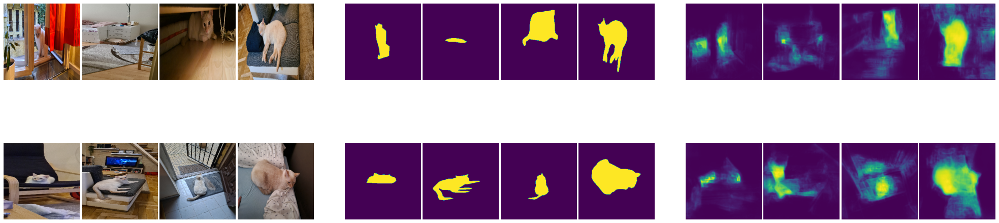

In [ ]:
visualizeTestPredictions(test_images, test_masks, unet_pred_v1)

### U-Net model version 3

Extra Convolution layers to the deeper model

In [ ]:
def UNetModel_v3(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Encoder part - contraction
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(x)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d1)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(p1)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d2)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(p2)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d3)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p3)
    d4 = Dropout(0.2)(c4)    
    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d4)
    d4 = Dropout(0.2)(c4)    
    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)
    
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p4)
    d5 = Dropout(0.3)(c5)    
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d5)
    d5 = Dropout(0.3)(c5)    
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d5)
    p5 = MaxPooling2D(pool_size = (2, 2))(c5)
    
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p5)
    d6 = Dropout(0.3)(c6)    
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d6)
    d6 = Dropout(0.3)(c6)    
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d6)
    p6 = MaxPooling2D(pool_size = (2, 2))(c6)
    
    ## Bottleneck part - bottom
    c7 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(p6)
    d7 = Dropout(0.4)(c7)
    c7 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(d7)
    d7 = Dropout(0.4)(c7)
    c7 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(d7)
    
    # Decoder part - expansion
    u8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c7))
    u8 = concatenate([u8, c6], axis = 3)
    c8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(u8)
    d8 = Dropout(0.3)(c8)
    c8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d8)
    d8 = Dropout(0.3)(c8)
    c8 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d8)

    u9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c8))
    u9 = concatenate([u9, c5], axis = 3)
    c9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(u9)
    d9 = Dropout(0.3)(c9)
    c9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d9)
    d9 = Dropout(0.3)(c9)
    c9 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d9)

    u10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c9))
    u10 = concatenate([u10, c4], axis = 3)
    c10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(u10)
    d10 = Dropout(0.2)(c10)
    c10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d10)
    d10 = Dropout(0.2)(c10)
    c10 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d10)

    u11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c10))
    u11 = concatenate([u11, c3], axis = 3)
    c11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(u11)
    d11 = Dropout(0.2)(c11)
    c11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d11)
    d11 = Dropout(0.2)(c11)
    c11 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d11)
    
    u12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c11))
    u12 = concatenate([u12, c2], axis = 3)
    c12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(u12)
    d12 = Dropout(0.1)(c12)
    c12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d12)
    d12 = Dropout(0.1)(c12)
    c12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d12)
    
    u13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c12))
    u13 = concatenate([u13, c1], axis = 3)
    c13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(u13)
    d13 = Dropout(0.1)(c13)
    c13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d13)
    d13 = Dropout(0.1)(c13)
    c13 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d13)

    outputs = Conv2D(N_CLASSES, (1, 1), activation = 'sigmoid')(c13)
    
    model = Model(inputs, outputs, name = 'U-Net_v3')
    
    return model

In [ ]:
unet_model_v3 = UNetModel_v3(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
unet_model_v3.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE), 
                      loss = LOSS, 
                      metrics = METRICS)
unet_model_v3.summary()

Model: "U-Net_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_56 (Conv2D)             (None, 256, 256, 16  448         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_22 (Dropout)           (None, 256, 256, 16  0           ['conv2d_56[0][0]']              
                                )                                                          

In [ ]:
unet_train_v3 = unet_model_v3.fit(train_gen,
                                  validation_data=val_gen,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH,
                                  validation_steps = VALIDATION_STEPS,
                                  verbose = True)

Epoch 1/25
281/281 [==============================] - 73s 248ms/step - loss: 0.4975 - accuracy: 0.8160 - val_loss: 0.4467 - val_accuracy: 0.8090
Epoch 2/25
281/281 [==============================] - 69s 245ms/step - loss: 0.4148 - accuracy: 0.8190 - val_loss: 0.4216 - val_accuracy: 0.8122
Epoch 3/25
281/281 [==============================] - 69s 244ms/step - loss: 0.3868 - accuracy: 0.8273 - val_loss: 0.4256 - val_accuracy: 0.8106
Epoch 4/25
281/281 [==============================] - 69s 245ms/step - loss: 0.3710 - accuracy: 0.8346 - val_loss: 0.3691 - val_accuracy: 0.8365
Epoch 5/25
281/281 [==============================] - 69s 244ms/step - loss: 0.4094 - accuracy: 0.8241 - val_loss: 0.3943 - val_accuracy: 0.8247
Epoch 6/25
281/281 [==============================] - 69s 245ms/step - loss: 0.3870 - accuracy: 0.8286 - val_loss: 0.3706 - val_accuracy: 0.8297
Epoch 7/25
281/281 [==============================] - 69s 244ms/step - loss: 0.3605 - accuracy: 0.8416 - val_loss: 0.3497 - val_ac

In [ ]:
unet_model_v3.save('unet_v3')

INFO:tensorflow:Assets written to: unet_v3\assets


INFO:tensorflow:Assets written to: unet_v3\assets


In [ ]:
unet_model_v3_rl = keras.models.load_model('unet_v3')

In [ ]:
unet_model_v3_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 1s 652ms/step - loss: 0.1895 - accuracy: 0.9279


[0.18946486711502075, 0.9279365539550781]

In [ ]:
unet_pred_v3 = unet_model_v3_rl.predict(test_images)

1/1 [==============================] - 0s 371ms/step


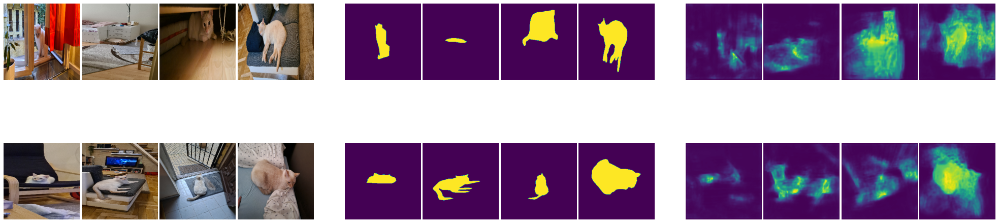

In [ ]:
visualizeTestPredictions(test_images, test_masks, unet_pred_v3)

### U-Net model version 4

Version 1 with Batch normalization

included in the thesis

In [ ]:
def UNetModel_v4(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Encoder part - contraction
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(x)
    c1 = BatchNormalization()(c1)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(p1)
    c2 = BatchNormalization()(c2)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(p2)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p3)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.2)(c4)    
    c4 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)
    
    ## Bottleneck part - bottom
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p4)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.3)(c5)
    c5 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    
    # Decoder part - expansion
    u6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c5))
    u6 = concatenate([u6, c4], axis = 3)
    c6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(u6)
    c6 = BatchNormalization()(c6)
    d6 = Dropout(0.2)(c6)
    c6 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d6)
    c6 = BatchNormalization()(c6)

    u7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c6))
    u7 = concatenate([u7, c3], axis = 3)
    c7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(u7)
    c7 = BatchNormalization()(c7)
    d7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d7)
    c7 = BatchNormalization()(c7)

    u8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c7))
    u8 = concatenate([u8, c2], axis = 3)
    c8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(u8)
    c8 = BatchNormalization()(c8)
    d8 = Dropout(0.1)(c8)
    c8 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same')(d8)
    c8 = BatchNormalization()(c8)

    u9 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c8))
    u9 = concatenate([u9, c1], axis = 3)
    c9 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(u9)
    c9 = BatchNormalization()(c9)
    d9 = Dropout(0.1)(c9)
    c9 = Conv2D(16, (3, 3), activation = 'relu', padding = 'same')(d9)
    c9 = BatchNormalization()(c9)

    outputs = Conv2D(N_CLASSES, (1, 1), activation = 'sigmoid')(c9)
    
    model = Model(inputs, outputs, name = 'U-Net_v4')
    
    return model

In [ ]:
unet_model_v4 = UNetModel_v4(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
unet_model_v4.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE), 
                      loss = LOSS, 
                      metrics = METRICS)
unet_model_v4.summary()

Model: "U-Net_v4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_23 (Conv2D)             (None, 256, 256, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_18 (BatchN  (None, 256, 256, 16  64         ['conv2d_23[0][0]']              
 ormalization)                  )                                                          

In [ ]:
unet_train_v4 = unet_model_v4.fit(train_gen,
                                  validation_data=val_gen,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH,
                                  validation_steps = VALIDATION_STEPS,
                                  verbose = True)

Epoch 1/25
281/281 [==============================] - 46s 163ms/step - loss: 0.1112 - accuracy: 0.9562 - val_loss: 0.2096 - val_accuracy: 0.9210
Epoch 2/25
281/281 [==============================] - 46s 162ms/step - loss: 0.1169 - accuracy: 0.9542 - val_loss: 0.2267 - val_accuracy: 0.9260
Epoch 3/25
281/281 [==============================] - 46s 162ms/step - loss: 0.1024 - accuracy: 0.9602 - val_loss: 0.2047 - val_accuracy: 0.9280
Epoch 4/25
281/281 [==============================] - 45s 162ms/step - loss: 0.0999 - accuracy: 0.9613 - val_loss: 0.2093 - val_accuracy: 0.9293
Epoch 5/25
281/281 [==============================] - 44s 158ms/step - loss: 0.0916 - accuracy: 0.9645 - val_loss: 0.2015 - val_accuracy: 0.9306
Epoch 6/25
281/281 [==============================] - 46s 163ms/step - loss: 0.0914 - accuracy: 0.9645 - val_loss: 0.2062 - val_accuracy: 0.9321
Epoch 7/25
281/281 [==============================] - 46s 162ms/step - loss: 0.0919 - accuracy: 0.9642 - val_loss: 0.2197 - val_ac

In [ ]:
unet_model_v4.save('unet_v4_2')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: unet_v4_2\assets


INFO:tensorflow:Assets written to: unet_v4_2\assets


In [ ]:
unet_model_v4_2_rl = keras.models.load_model('unet_v4_2')

In [ ]:
unet_pred_v4_2_rl = unet_model_v4_2_rl.predict(test_images)

1/1 [==============================] - 0s 19ms/step


In [ ]:
unet_model_v4_2_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 0s 48ms/step - loss: 0.1048 - accuracy: 0.9651


[0.1048111617565155, 0.9650630950927734]

In [ ]:
unet_pred_v4_2_rl_original = unet_pred_v4_2_rl

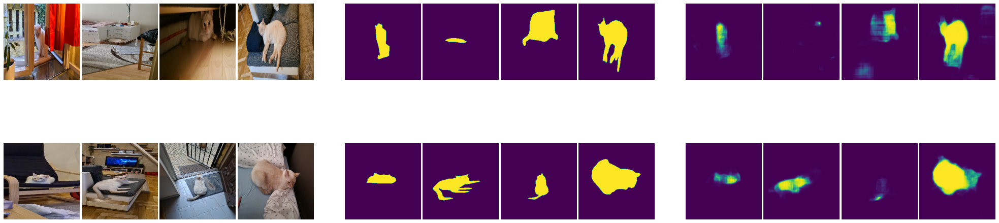

In [ ]:
visualizeTestPredictions(test_images, test_masks, unet_pred_v4_2_rl_original)

changing mask threshold to 0.9 from 0.5

In [ ]:
unet_pred_v4_2_rl[unet_pred_v4_2_rl >= 0.9] = 1
unet_pred_v4_2_rl[unet_pred_v4_2_rl < 0.9] = 0

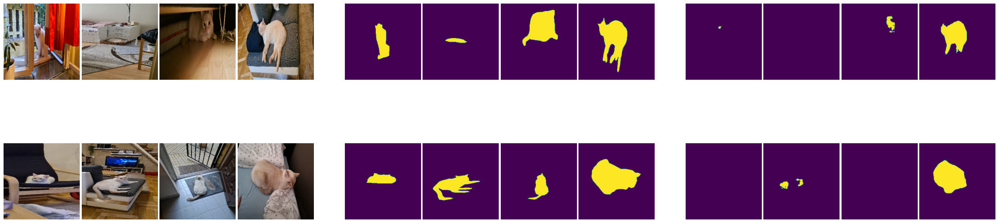

In [ ]:
visualizeTestPredictions(test_images, test_masks, unet_pred_v4_2_rl)

### U-Net model version 5

start from 64 features

In [ ]:
def UNetModel_v5(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = inputs
    
    # Encoder part - contraction
    c1 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(x)
    c1 = BatchNormalization()(c1)
    d1 = Dropout(0.1)(c1)
    c1 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d1)
    c1 = BatchNormalization()(c1)
    p1 = MaxPooling2D(pool_size = (2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(p1)
    c2 = BatchNormalization()(c2)
    d2 = Dropout(0.1)(c2)
    c2 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d2)
    c2 = BatchNormalization()(c2)
    p2 = MaxPooling2D(pool_size = (2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(p2)
    c3 = BatchNormalization()(c3)
    d3 = Dropout(0.2)(c3)
    c3 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d3)
    c3 = BatchNormalization()(c3)
    p3 = MaxPooling2D(pool_size = (2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(p3)
    c4 = BatchNormalization()(c4)
    d4 = Dropout(0.2)(c4)    
    c4 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d4)
    c4 = BatchNormalization()(c4)
    p4 = MaxPooling2D(pool_size = (2, 2))(c4)
    
    ## Bottleneck part - bottom
    c5 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(p4)
    c5 = BatchNormalization()(c5)
    d5 = Dropout(0.3)(c5)
    c5 = Conv2D(1024, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
    
    # Decoder part - expansion
    u6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c5))
    u6 = concatenate([u6, c4], axis = 3)
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(u6)
    c6 = BatchNormalization()(c6)
    d6 = Dropout(0.2)(c6)
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d6)
    c6 = BatchNormalization()(c6)

    u7 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c6))
    u7 = concatenate([u7, c3], axis = 3)
    c7 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(u7)
    c7 = BatchNormalization()(c7)
    d7 = Dropout(0.2)(c7)
    c7 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d7)
    c7 = BatchNormalization()(c7)

    u8 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c7))
    u8 = concatenate([u8, c2], axis = 3)
    c8 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(u8)
    c8 = BatchNormalization()(c8)
    d8 = Dropout(0.1)(c8)
    c8 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d8)
    c8 = BatchNormalization()(c8)

    u9 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c8))
    u9 = concatenate([u9, c1], axis = 3)
    c9 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(u9)
    c9 = BatchNormalization()(c9)
    d9 = Dropout(0.1)(c9)
    c9 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d9)
    c9 = BatchNormalization()(c9)

    outputs = Conv2D(N_CLASSES, (1, 1), activation = 'sigmoid')(c9)
    
    model = Model(inputs, outputs, name = 'U-Net_v5')
    
    return model

In [ ]:
unet_model_v5 = UNetModel_v5(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
unet_model_v5.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE_small), 
                      loss = LOSS, 
                      metrics = METRICS)
unet_model_v5.summary()

Model: "U-Net_v5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_69 (Conv2D)             (None, 256, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_54 (BatchN  (None, 256, 256, 64  256        ['conv2d_69[0][0]']              
 ormalization)                  )                                                          

In [ ]:
unet_train_v5 = unet_model_v5.fit(train_gen_small,
                                  validation_data=val_gen_small,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH_small,
                                  validation_steps = VALIDATION_STEPS_small,
                                  verbose = True)

Epoch 1/25
563/563 [==============================] - 217s 377ms/step - loss: 0.6939 - accuracy: 0.6362 - val_loss: 0.4912 - val_accuracy: 0.8134
Epoch 2/25
563/563 [==============================] - 211s 375ms/step - loss: 0.5926 - accuracy: 0.7635 - val_loss: 0.4616 - val_accuracy: 0.8378
Epoch 3/25
563/563 [==============================] - 210s 373ms/step - loss: 0.5526 - accuracy: 0.8031 - val_loss: 0.4315 - val_accuracy: 0.8487
Epoch 4/25
563/563 [==============================] - 211s 374ms/step - loss: 0.5183 - accuracy: 0.8242 - val_loss: 0.4788 - val_accuracy: 0.8440
Epoch 5/25
563/563 [==============================] - 210s 373ms/step - loss: 0.4879 - accuracy: 0.8402 - val_loss: 0.3991 - val_accuracy: 0.8565
Epoch 6/25
563/563 [==============================] - 210s 373ms/step - loss: 0.4650 - accuracy: 0.8480 - val_loss: 0.4295 - val_accuracy: 0.8509
Epoch 7/25
563/563 [==============================] - 211s 375ms/step - loss: 0.4422 - accuracy: 0.8569 - val_loss: 0.4015 -

In [ ]:
unet_model_v5.save('unet_v5')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: unet_v5\assets


INFO:tensorflow:Assets written to: unet_v5\assets


In [ ]:
unet_model_v5_rl = keras.models.load_model('unet_v5')

In [ ]:
unet_model_v5_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 5s 5s/step - loss: 0.2210 - accuracy: 0.9273


[0.22095957398414612, 0.9272632598876953]

In [ ]:
unet_pred_v5 = unet_model_v5_rl.predict(test_images)

1/1 [==============================] - 0s 19ms/step


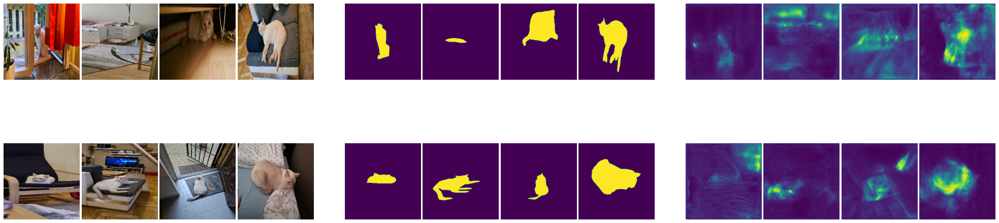

In [ ]:
visualizeTestPredictions(test_images, test_masks, unet_pred_v5)

## Transfer Learning

https://chroniclesofai.com/transfer-learning-with-keras-resnet-50/

https://medium.com/@kenneth.ca95/a-guide-to-transfer-learning-with-keras-using-resnet50-a81a4a28084b

https://www.learndatasci.com/tutorials/hands-on-transfer-learning-keras/

https://towardsdatascience.com/transfer-learning-with-vgg16-and-keras-50ea161580b4

https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/

### VGG16 pre-trained model

In [ ]:
def VGG16Model_tl(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    
    conv_base = VGG16(include_top=False,
                     weights='imagenet', 
                     input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    
    # Create a new 'top' of the model (i.e. fully-connected layers).
    # This is 'bootstrapping' a new top_model onto the pretrained layers.
    l1 = conv_base.output
    l2 = Flatten(name="flatten")(l1)
    l3 = Dense(4096, activation='relu')(l2)
    l4 = Dense(4096, activation='relu')(l3)
    l5 = Dense(1000, activation='relu')(l4)
    l6 = Dropout(0.2)(l5)
    l7 = Dense(65536, activation='softmax')(l6)
    outputs = tf.reshape(l7, (-1, IMG_HEIGHT, IMG_WIDTH, N_CLASSES))
    
    model = Model(conv_base.input, outputs, name = 'VGG16_tl')
    
    for layer in model.layers[:-6]:
        layer.trainable = False
    
    return model

In [ ]:
vgg16_model_tl = VGG16Model_tl(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
vgg16_model_tl.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE_small), 
                      loss = LOSS, 
                      metrics = METRICS)
vgg16_model_tl.summary()

Model: "VGG16_tl"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0  

In [ ]:
vgg16_train_yl = vgg16_model_tl.fit(train_gen_small,
                                  validation_data=val_gen_small,
                                  epochs = EPOCHS,
                                  steps_per_epoch = STEPS_PER_EPOCH_small,
                                  validation_steps = VALIDATION_STEPS_small,
                                  verbose = True)

Epoch 1/25
563/563 [==============================] - 209s 371ms/step - loss: 1.9780 - accuracy: 0.8168 - val_loss: 2.0444 - val_accuracy: 0.8101
Epoch 2/25
563/563 [==============================] - 68s 120ms/step - loss: 1.9448 - accuracy: 0.8188 - val_loss: 2.0219 - val_accuracy: 0.8104
Epoch 3/25
563/563 [==============================] - 66s 117ms/step - loss: 1.8979 - accuracy: 0.8210 - val_loss: 2.0135 - val_accuracy: 0.8103
Epoch 4/25
563/563 [==============================] - 67s 119ms/step - loss: 1.8995 - accuracy: 0.8197 - val_loss: 2.0028 - val_accuracy: 0.8105
Epoch 5/25
563/563 [==============================] - 65s 116ms/step - loss: 1.8920 - accuracy: 0.8193 - val_loss: 1.9993 - val_accuracy: 0.8105
Epoch 6/25
563/563 [==============================] - 65s 116ms/step - loss: 1.8946 - accuracy: 0.8181 - val_loss: 2.0016 - val_accuracy: 0.8103
Epoch 7/25
563/563 [==============================] - 67s 118ms/step - loss: 1.8683 - accuracy: 0.8199 - val_loss: 2.0102 - val_a

In [ ]:
vgg16_model_tl.save('vgg16_tl')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: vgg16_tl\assets


INFO:tensorflow:Assets written to: vgg16_tl\assets


In [ ]:
vgg16_model_tl_rl = keras.models.load_model('vgg16_tl')

In [ ]:
vgg16_model_tl_rl.evaluate(test_images, test_masks)

1/1 [==============================] - 6s 6s/step - loss: 0.8561 - accuracy: 0.9146


[0.8560693860054016, 0.9146137237548828]

In [ ]:
vgg16_pred_tl = vgg16_model_tl_rl.predict(test_images)

1/1 [==============================] - 0s 167ms/step


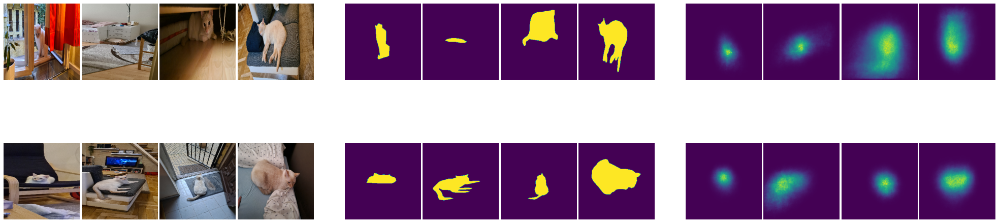

In [ ]:
visualizeTestPredictions(test_images, test_masks, vgg16_pred_tl)

### ResNet50 pre-trained model

In [ ]:
def ResNet50Model_tl(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    
    res_base = ResNet50(include_top=False,
                         weights='imagenet', 
                         input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    
    l1 = res_base.output
    l2 = Flatten()(l1)
    l3 = Dense(500, activation='relu')(l2)
    l4 = Dropout(0.2)(l3)
    l5 = Dense(750, activation='relu')(l4)
    l6 = Dropout(0.2)(l5)
    l7 = Dense(1000, activation='relu')(l6)
    l8 = Dense(65536, activation='softmax')(l7)
    outputs = tf.reshape(l8, (-1, IMG_HEIGHT, IMG_WIDTH, N_CLASSES))
    
    model = Model(res_base.input, outputs, name = 'ResNet50_tl')
    
    for layer in model.layers[:-7]:
        layer.trainable = False
    
    return model


In [ ]:
resnet50_model_tl_1 = ResNet50Model_tl(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
resnet50_model_tl_1.compile(optimizer = RMSprop (learning_rate = LEARNING_RATE_small), 
                      loss = LOSS, 
                      metrics = METRICS)
resnet50_model_tl_1.summary()

Model: "ResNet50_tl"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                        

In [ ]:
resnet50_train_yl_1 = resnet50_model_tl_1.fit(train_gen_small,
                                  validation_data=val_gen_small,
                                  epochs = 100,
                                  steps_per_epoch = STEPS_PER_EPOCH_small,
                                  validation_steps = VALIDATION_STEPS_small,
                                  verbose = True)

Epoch 1/100
563/563 [==============================] - 105s 183ms/step - loss: 1.9795 - accuracy: 0.8174 - val_loss: 2.0566 - val_accuracy: 0.8099
Epoch 2/100
563/563 [==============================] - 55s 98ms/step - loss: 1.9692 - accuracy: 0.8180 - val_loss: 2.0599 - val_accuracy: 0.8093
Epoch 3/100
563/563 [==============================] - 51s 91ms/step - loss: 1.9679 - accuracy: 0.8179 - val_loss: 2.0414 - val_accuracy: 0.8111
Epoch 4/100
563/563 [==============================] - 51s 91ms/step - loss: 1.9138 - accuracy: 0.8227 - val_loss: 2.0504 - val_accuracy: 0.8106
Epoch 5/100
563/563 [==============================] - 51s 91ms/step - loss: 1.9624 - accuracy: 0.8184 - val_loss: 2.0373 - val_accuracy: 0.8114
Epoch 6/100
563/563 [==============================] - 51s 91ms/step - loss: 1.9664 - accuracy: 0.8179 - val_loss: 2.0580 - val_accuracy: 0.8094
Epoch 7/100
563/563 [==============================] - 51s 91ms/step - loss: 1.9348 - accuracy: 0.8210 - val_loss: 2.0421 - val_

In [ ]:
resnet50_model_tl_1.save('resnet50_tl_2')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: resnet50_tl_2\assets


INFO:tensorflow:Assets written to: resnet50_tl_2\assets


In [ ]:
resnet50_model_tl_rl_2 = keras.models.load_model('resnet50_tl_2')

In [ ]:
resnet50_model_tl_rl_2.evaluate(test_images, test_masks)

1/1 [==============================] - 1s 1s/step - loss: 0.8893 - accuracy: 0.9146


[0.8892677426338196, 0.9146137237548828]

In [ ]:
resnet50_pred_tl_2 = resnet50_model_tl_rl_2.predict(test_images)

1/1 [==============================] - 1s 803ms/step


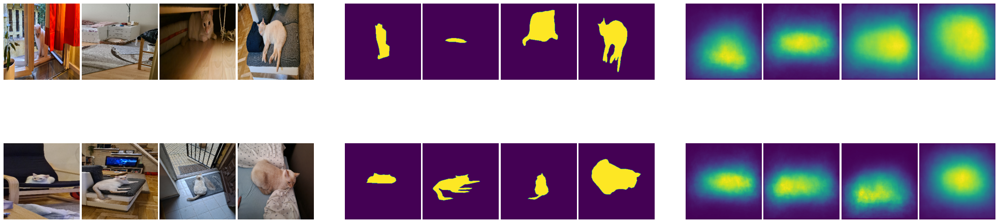

In [ ]:
visualizeTestPredictions(test_images, test_masks, resnet50_pred_tl_2)

#### small batches and else, 100 epochs, 250, 250, 1000 sized layers, RMSprop

In [ ]:
resnet50_train_yl_1 = resnet50_model_tl_1.fit(train_gen_small,
                                  validation_data=val_gen_small,
                                  epochs = 100,
                                  steps_per_epoch = STEPS_PER_EPOCH_small,
                                  validation_steps = VALIDATION_STEPS_small,
                                  verbose = True)

Epoch 1/100
563/563 [==============================] - 69s 116ms/step - loss: 1.9613 - accuracy: 0.8191 - val_loss: 2.0476 - val_accuracy: 0.8105
Epoch 2/100
563/563 [==============================] - 70s 124ms/step - loss: 1.9561 - accuracy: 0.8190 - val_loss: 2.0501 - val_accuracy: 0.8103
Epoch 3/100
563/563 [==============================] - 71s 126ms/step - loss: 1.9555 - accuracy: 0.8190 - val_loss: 2.0543 - val_accuracy: 0.8098
Epoch 4/100
563/563 [==============================] - 69s 123ms/step - loss: 1.9542 - accuracy: 0.8191 - val_loss: 2.0557 - val_accuracy: 0.8097
Epoch 5/100
563/563 [==============================] - 72s 129ms/step - loss: 1.9558 - accuracy: 0.8190 - val_loss: 2.0456 - val_accuracy: 0.8106
Epoch 6/100
563/563 [==============================] - 61s 109ms/step - loss: 1.9553 - accuracy: 0.8190 - val_loss: 2.0395 - val_accuracy: 0.8111
Epoch 7/100
563/563 [==============================] - 62s 110ms/step - loss: 1.9559 - accuracy: 0.8189 - val_loss: 2.0641 -

In [ ]:
resnet50_model_tl_1.save('resnet50_tl_1')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: resnet50_tl_1\assets


INFO:tensorflow:Assets written to: resnet50_tl_1\assets


In [ ]:
resnet50_model_tl_rl_1 = keras.models.load_model('resnet50_tl_1')

In [ ]:
resnet50_model_tl_rl_1.evaluate(test_images, test_masks)

1/1 [==============================] - 1s 1s/step - loss: 0.8803 - accuracy: 0.9146


[0.8802832365036011, 0.9146137237548828]

In [ ]:
resnet50_pred_tl_1 = resnet50_model_tl_rl_1.predict(test_images)

1/1 [==============================] - 1s 845ms/step


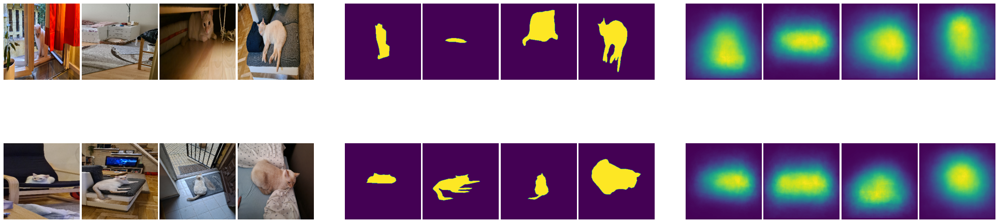

In [ ]:
visualizeTestPredictions(test_images, test_masks, resnet50_pred_tl_1)

## VGG - U-Net Structure

In [ ]:
model = VGG16(include_top=False,
                     weights='imagenet', 
                     input_shape=(256, 256, 3))
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
def VGGUNetModel(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES):
    
    vgg16_base = VGG16(include_top=False,
                     weights='imagenet', 
                     input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    
    # Create a new 'top' of the model (i.e. fully-connected layers).
    # This is 'bootstrapping' a new top_model onto the pretrained layers.
    l1 = vgg16_base.output
    
    x1 = vgg16_base.get_layer('block1_conv2').output
    x2 = vgg16_base.get_layer('block2_conv2').output
    x3 = vgg16_base.get_layer('block3_conv3').output
    x4 = vgg16_base.get_layer('block4_conv3').output
    x5 = vgg16_base.get_layer('block5_conv3').output
    
    u5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(l1)
    c5 = BatchNormalization()(u5)
    d5 = Dropout(0.2)(c5)
    c5 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d5)
    c5 = BatchNormalization()(c5)
        
    # Decoder part - expansion
    # Up 1
    u6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c5))
    u6 = concatenate([u6, x5], axis = 3)
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(u6)
    c6 = BatchNormalization()(c6)
    d6 = Dropout(0.2)(c6)
    c6 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d6)
    c6 = BatchNormalization()(c6)

    # Up 2    
    u7 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c6))
    u7 = concatenate([u7, x4], axis = 3)
    c7 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(u7)
    c7 = BatchNormalization()(c7)
    d7 = Dropout(0.2)(c7)
    c7 = Conv2D(512, (3, 3), activation = 'relu', padding = 'same')(d7)
    c7 = BatchNormalization()(c7)

    # Up 3
    u8 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c7))
    u8 = concatenate([u8, x3], axis = 3)
    c8 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(u8)
    c8 = BatchNormalization()(c8)
    d8 = Dropout(0.1)(c8)
    c8 = Conv2D(256, (3, 3), activation = 'relu', padding = 'same')(d8)
    c8 = BatchNormalization()(c8)

    # Up 4
    u9 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c8))
    u9 = concatenate([u9, x2], axis = 3)
    c9 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(u9)
    c9 = BatchNormalization()(c9)
    d9 = Dropout(0.1)(c9)
    c9 = Conv2D(128, (3, 3), activation = 'relu', padding = 'same')(d9)
    c9 = BatchNormalization()(c9)
    
    # Up 5
    u10 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(UpSampling2D(size = (2, 2))(c9))
    u10 = concatenate([u10, x1], axis = 3)
    c10 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(u10)
    c10 = BatchNormalization()(c10)
    d10 = Dropout(0.1)(c10)
    c10 = Conv2D(64, (3, 3), activation = 'relu', padding = 'same')(d10)
    c10 = BatchNormalization()(c10)

    outputs = Conv2D(N_CLASSES, (1, 1), activation = 'sigmoid')(c10)
    
    model = Model(vgg16_base.input, outputs, name = 'VGG_U-Net') 
    
    for layer in model.layers[:-41]:
        layer.trainable = False
    
    return model

In [ ]:
vgg_unet_model = VGGUNetModel(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, N_CLASSES)
vgg_unet_model.compile(optimizer = OPTIMIZER (learning_rate = LEARNING_RATE), 
                      loss = LOSS, 
                      metrics = METRICS)
vgg_unet_model.summary()

Model: "VGG_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           
                                )                                                         

In [ ]:
vgg_unet_train = vgg_unet_model.fit(train_gen,
                                  validation_data=val_gen,
                                  epochs = 50,
                                  steps_per_epoch = STEPS_PER_EPOCH,
                                  validation_steps = VALIDATION_STEPS,
                                  verbose = True)

Epoch 1/50
281/281 [==============================] - 199s 675ms/step - loss: 0.3170 - accuracy: 0.8841 - val_loss: 3.4085 - val_accuracy: 0.7361
Epoch 2/50
281/281 [==============================] - 162s 578ms/step - loss: 0.2117 - accuracy: 0.9165 - val_loss: 0.2297 - val_accuracy: 0.8989
Epoch 3/50
281/281 [==============================] - 162s 578ms/step - loss: 0.1863 - accuracy: 0.9254 - val_loss: 0.3397 - val_accuracy: 0.8551
Epoch 4/50
281/281 [==============================] - 162s 579ms/step - loss: 0.1693 - accuracy: 0.9330 - val_loss: 0.1850 - val_accuracy: 0.9276
Epoch 5/50
281/281 [==============================] - 162s 578ms/step - loss: 0.1552 - accuracy: 0.9390 - val_loss: 0.4585 - val_accuracy: 0.8196
Epoch 6/50
281/281 [==============================] - 162s 579ms/step - loss: 0.1425 - accuracy: 0.9440 - val_loss: 0.2136 - val_accuracy: 0.9161
Epoch 7/50
281/281 [==============================] - 163s 579ms/step - loss: 0.1327 - accuracy: 0.9482 - val_loss: 0.1707 -

In [ ]:
vgg_unet_model.save('vgg_unet_3')

[WARNING] save:__init__:233 - Found untraced functions such as %s while saving (showing %d of %d). These functions will not be directly callable after loading.
[INFO   ] builder_impl:copy_assets_to_destination_dir:779 - Assets written to: %s


INFO:tensorflow:Assets written to: vgg_unet_3\assets


INFO:tensorflow:Assets written to: vgg_unet_3\assets


In [ ]:
vgg_unet_model_rl_3 = keras.models.load_model('vgg_unet_3')

In [ ]:
vgg_unet_model_rl_3.evaluate(test_images, test_masks)

1/1 [==============================] - 5s 5s/step - loss: 0.2639 - accuracy: 0.9296


[0.26390406489372253, 0.9296340942382812]

In [ ]:
vgg_unet_pred_3 = vgg_unet_model_rl_3.predict(test_images)

1/1 [==============================] - 0s 336ms/step


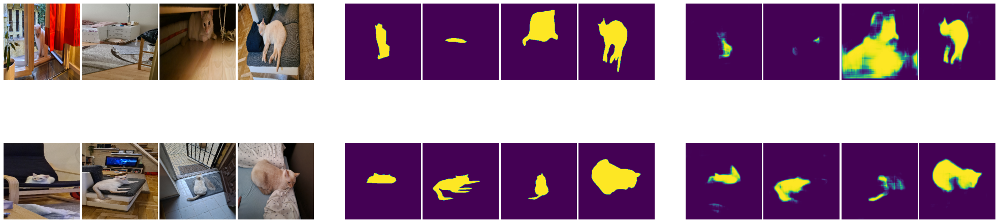

In [ ]:
visualizeTestPredictions(test_images, test_masks, vgg_unet_pred_3)